### Data Profiling ###
Some further data profiling action with the newly prepared usage_stats file.

In [1]:
#import libraries
%matplotlib inline

import seaborn as sns
import pandas as pd
import pysal as ps
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import folium as fo
import folium.plugins as plugins
import requests
import json
from geopy.geocoders import Nominatim
from geopy.distance import geodesic
from datetime import datetime, timedelta
from folium.plugins import HeatMap

D:\Anaconda3\envs\prana\lib\site-packages\pysal\__init__.py:65: VisibleDeprecationWarning: PySAL's API will be changed on 2018-12-31. The last release made with this API is version 1.14.4. A preview of the next API version is provided in the `pysal` 2.0 prelease candidate. The API changes and a guide on how to change imports is provided at https://migrating.pysal.org
  ), VisibleDeprecationWarning)


In [2]:
df_stations = pd.read_csv("usage_stats_cleaned_new.csv")
df_stations.rename(columns = {'StartStation  latitude':'StartStation latitude', 'EndStation  latitude':'EndStation latitude'}, inplace = True)

In [3]:
print(df_stations.count())
df_stations[df_stations["StartStation Id"] == 1].head()

def distance(row):
    """Get distance between pairs of lat-lon points"""
    return geodesic((row["StartStation latitude"], row["StartStation longitude"]), 
                    (row["EndStation latitude"], row["EndStation longitude"])).km

df_stations['distance (geodesic)'] = df_stations.apply(lambda row: distance(row),axis=1)
df_stations.head()


StartStation Id           6643573
Start Date                6643573
EndStation Id             6643573
End Date                  6643573
Duration                  6643573
StartStation Id Used      6643573
EndStation Id Used        6643573
StartStation Address      6643573
StartStation latitude     6643573
StartStation longitude    6643573
StartStation capacity     6643573
EndStation Address        6643573
EndStation latitude       6643573
EndStation longitude      6643573
EndStation capacity       6643573
dtype: int64


,StartStation Id,Start Date,EndStation Id,End Date,Duration,StartStation Id Used,EndStation Id Used,StartStation Address,StartStation latitude,StartStation longitude,StartStation capacity,EndStation Address,EndStation latitude,EndStation longitude,EndStation capacity,distance (geodesic)
0,836,13/09/2018 18:19,833,13/09/2018 19:10,3060,325,7141,"York Way, Kings Cross",51.541596,-0.125441,24,"Saltoun Road, Brixton",51.460232,-0.115375,42,9.079331
1,831,21/05/2018 10:55,148,21/05/2018 11:12,1020,2294,47890,"St John's Crescent, Brixton",51.466232,-0.113180,25,"Tachbrook Street, Victoria",51.492111,-0.138365,16,3.369193
2,831,04/07/2018 00:16,833,04/07/2018 03:18,10920,2294,7141,"St John's Crescent, Brixton",51.466232,-0.113180,25,"Saltoun Road, Brixton",51.460232,-0.115375,42,0.684753
3,831,04/07/2018 00:16,833,04/07/2018 03:20,11040,2294,7141,"St John's Crescent, Brixton",51.466232,-0.113180,25,"Saltoun Road, Brixton",51.460232,-0.115375,42,0.684753
4,831,13/08/2018 22:50,833,13/08/2018 23:10,1200,2294,7141,"St John's Crescent, Brixton",51.466232,-0.113180,25,"Saltoun Road, Brixton",51.460232,-0.115375,42,0.684753


In [4]:
#Max distance
print(df_stations.iloc[df_stations["distance (geodesic)"].idxmax()])
#Min distance
df_stations.iloc[df_stations["distance (geodesic)"].idxmin()]

StartStation Id                                    790
Start Date                            02/07/2018 17:18
EndStation Id                                      694
End Date                              02/07/2018 18:28
Duration                                          4200
StartStation Id Used                             23992
EndStation Id Used                               15593
StartStation Address      Stratford Station, Stratford
StartStation latitude                          51.5418
StartStation longitude                        -0.00481
StartStation capacity                               28
EndStation Address         Putney Rail Station, Putney
EndStation latitude                            51.4607
EndStation longitude                         -0.216526
EndStation capacity                                 20
distance (geodesic)                             17.248
Name: 1278337, dtype: object


StartStation Id                                    273
Start Date                            29/07/2017 13:57
EndStation Id                                      819
End Date                              29/07/2017 13:57
Duration                                             0
StartStation Id Used                             75013
EndStation Id Used                               23772
StartStation Address      Belvedere Road 1, South Bank
StartStation latitude                          51.5061
StartStation longitude                       -0.114686
StartStation capacity                               38
EndStation Address        Belvedere Road 2, South Bank
EndStation latitude                            51.5062
EndStation longitude                         -0.114842
EndStation capacity                                 38
distance (geodesic)                          0.0137722
Name: 2599304, dtype: object

In [5]:
#Set list of relevance
filter_list = ["EndStation Id",
           "EndStation Id Used",
           "Start Date",
           "End Date",
         #  "StartStation Address",
           "EndStation Address",
           "EndStation latitude",
           "EndStation longitude",
           "EndStation capacity",
           "distance (geodesic)"
]
df_startStations = df_stations.drop(filter_list, axis = 1)
#Unique stations
df_startStations.drop_duplicates(subset=("StartStation Id"), keep="first", inplace=True)
print(df_startStations.count())
df_startStations.dropna(0, inplace=True)
df_startStations.head()

StartStation Id           783
Duration                  783
StartStation Id Used      783
StartStation Address      783
StartStation latitude     783
StartStation longitude    783
StartStation capacity     783
dtype: int64


,StartStation Id,Duration,StartStation Id Used,StartStation Address,StartStation latitude,StartStation longitude,StartStation capacity
0,836,3060,325,"York Way, Kings Cross",51.541596,-0.125441,24
1,831,1020,2294,"St John's Crescent, Brixton",51.466232,-0.113180,25
25,829,1020,2323,"Wynne Road, Stockwell",51.469217,-0.112687,25
50,494,1140,3184,"South Quay East, Canary Wharf",51.501960,-0.016251,36
60,830,1020,3343,"Sidney Road, Stockwell",51.469202,-0.119023,27


In [6]:
df_startStations["StartStation capacity"] = df_startStations["StartStation capacity"].astype("str")
df_startStations["StartStation Id Used"] = df_startStations["StartStation Id Used"].astype("float64")
df_startStations.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 783 entries, 0 to 50204
Data columns (total 7 columns):
StartStation Id           783 non-null int64
Duration                  783 non-null int64
StartStation Id Used      783 non-null float64
StartStation Address      783 non-null object
StartStation latitude     783 non-null float64
StartStation longitude    783 non-null float64
StartStation capacity     783 non-null object
dtypes: float64(3), int64(2), object(2)
memory usage: 48.9+ KB


In [7]:
#Plot most used rental stations
import os

m = fo.Map(
    location=(51.509865, -0.118092),
    zoom_start= 10
)


df_startStations_top = df_startStations.sort_values(by=['StartStation Id Used'], ascending=False)[:1]
#top markers
for index, p in df_startStations_top[['StartStation latitude','StartStation longitude','StartStation capacity', 'StartStation Id Used']].iterrows():
    fo.Marker(
    location=[p['StartStation latitude'], p['StartStation longitude']],
    icon=fo.Icon(color='red'),
    popup="Capacity: " + p['StartStation capacity'] + '</br>' + " Used between 2016 and 2018: " + str(p['StartStation Id Used']),
    ).add_to(m)
    
df_startStations_rest = df_startStations.sort_values(by=['StartStation Id Used'], ascending=False)[1:10]
#rest markers
for index, p in df_startStations_rest[['StartStation latitude','StartStation longitude','StartStation capacity', 'StartStation Id Used']].iterrows():
    fo.Marker(
    location=[p['StartStation latitude'], p['StartStation longitude']],
    icon=fo.Icon(color='green'),
    popup="Capacity: " + p['StartStation capacity'] + '</br>' + " Used between 2016 and 2018: " + str(p['StartStation Id Used']),
    ).add_to(m)
    
    
# Circle marker
fo.CircleMarker([51.509865, -0.118092],
                    radius=10,
                    popup='Centroid',
                    color='darkred',
                    fill_opacity=0.2
                    ).add_to(m)


#For Normalizing reasons
max_amount = float(df_startStations['StartStation Id Used'].max())

hm_wide = HeatMap(list(zip(df_startStations["StartStation latitude"].values, df_startStations["StartStation longitude"].values, df_startStations["StartStation Id Used"].values)),
                   min_opacity=0.4,
                   max_val=max_amount,
                   radius=17, blur=15, 
                   max_zoom=8, 
                 )

hm_wide.add_to(m)
m.save(outfile= "most_stations.html")
m

In [8]:
#Plot with folium

m = fo.Map(
    location=(51.509865, -0.118092),
    zoom_start= 12
)


#For Normalizing reasons
max_amount = float(df_startStations['StartStation Id Used'].max())

hm_wide = HeatMap(list(zip(df_startStations["StartStation latitude"].values, df_startStations["StartStation longitude"].values, df_startStations["StartStation Id Used"].values)),
                   min_opacity=0.4,
                   max_val=max_amount,
                   radius=17, blur=15, 
                   max_zoom=8, 
                 )

hm_wide.add_to(m)
m

#### Plotting Routes ####
* Routes between StartStation and EndStation with Graphhopper API (n to m relation)
* Use time data (departure and arrival times) of each station for switching between day and night cycle

In [9]:
df_stations.head()
df_stations.info()
#Aggregate startstation id and endstation id
df_stations2 = df_stations
df_stations2["Frequency"] = df_stations.groupby(by=["StartStation Id", "EndStation Id"]).count().reset_index()["Duration"]
print("\nMost traveled route: ")
print(df_stations2.iloc[df_stations2["Frequency"].idxmax()])

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6643573 entries, 0 to 6643572
Data columns (total 16 columns):
StartStation Id           int64
Start Date                object
EndStation Id             int64
End Date                  object
Duration                  int64
StartStation Id Used      int64
EndStation Id Used        int64
StartStation Address      object
StartStation latitude     float64
StartStation longitude    float64
StartStation capacity     int64
EndStation Address        object
EndStation latitude       float64
EndStation longitude      float64
EndStation capacity       int64
distance (geodesic)       float64
dtypes: float64(5), int64(7), object(4)
memory usage: 811.0+ MB

Most traveled route: 
StartStation Id                                           159
Start Date                                   26/06/2016 12:50
EndStation Id                                             251
End Date                                     26/06/2016 13:26
Duration                  

In [10]:
from folium.plugins import MarkerCluster

df_routes = df_stations2.drop_duplicates(subset=("StartStation Id", "EndStation Id"), keep='first')

# graphhopper API
endpoint = 'http://i-nominatim-01.informatik.hs-ulm.de:11111/route?'
point = 'point='
urlEnd = '&locale=de&vehicle=bike&weighting=fastest&elevation=false&use_miles=false&type=json&points_encoded=false'

m = fo.Map(
    location=(51.509865, -0.118092),
    zoom_start=12,
    prefer_canvas=True,
    tiles='CartoDB dark_matter' #to see the routes better
)

#Marker cluster for performance
marker_cluster = MarkerCluster().add_to(m)

for index, p in df_routes[['StartStation latitude','StartStation longitude', 'EndStation latitude', 
                           'EndStation longitude', 'StartStation Address', 'EndStation Address', 
                           "Frequency"]][:2000].iterrows(): #problem map will be slow

    startX = str(p["StartStation latitude"])
    startY = str(p["StartStation longitude"])
    endX = str(p["EndStation latitude"])
    endY = str(p["EndStation longitude"])
    sname = str(p["StartStation Address"])
    ename = str(p["EndStation Address"])
    freq = p["Frequency"]

    try:
        r = requests.get(endpoint + point + startX + ',' + startY + '&' + point + endX + ',' + endY + urlEnd)
        #r = requests.get('http://i-nominatim-01.informatik.hs-ulm.de:11111/route?point=51.131,12.414&point=48.224,3.867&vehicle=bike&locale=de&type=json&points_encoded=false')
        r.json()
    except Exception:
        print("Something went wrong " + str(r.status_code))

    # Get list of waypoint coordinates
    inversed_coordinates = r.json()['paths'][0]['points']['coordinates']
    inversed_coordinates

    # folium
    coordinates = [(x, y) for (y, x) in inversed_coordinates]
    fo.features.PolyLine(coordinates, weight=(freq - df_routes["Frequency"].mean())/df_routes["Frequency"].std(),
                      #  opacity = (freq - df_routes["Frequency"].min())/(df_routes["Frequency"].max() - df_routes["Frequency"].min()),
                         popup="Used between 2016 and 2018: " + str(int(p["Frequency"])) + "x", opacity = 1).add_to(m)
    #y = (x - mean) / standard_deviation  (Standardization)
    #y = (x - min) / (max - min)  (Normalization)


#Add markers
df_startStations[:len(df_startStations)].apply(lambda row:fo.Marker(location=[row["StartStation latitude"], 
                                                  row["StartStation longitude"]],
                                                  popup=row['StartStation Address'],
                                                  icon=fo.Icon(color='darkblue', icon_color='white', icon='bicycle', angle=0, prefix='fa')).add_to(marker_cluster),axis=1)
#df_routes[:1000].apply(lambda row:fo.Marker(location=[row["EndStation latitude"], 
                                                #  row["EndStation longitude"]],
                                                #  popup=row['EndStation Address'],
                                               #   icon=fo.Icon(color='darkblue', icon_color='white', icon='bicycle', angle=0, prefix='fa')).add_to(marker_cluster),axis=1)
m.save(outfile= "routes_stations.html")
m

In [13]:
import grequests
from itertools import chain

endpoint = 'http://i-nominatim-01.informatik.hs-ulm.de:11111/route?'
point = 'point='
urlEnd = '&locale=de&vehicle=bike&weighting=fastest&elevation=false&use_miles=false&type=json&points_encoded=false'

liste = []

for index, p in df_routes[['StartStation latitude','StartStation longitude', 'EndStation latitude', 
                           'EndStation longitude', 'StartStation Address', 'EndStation Address', 
                           "Frequency"]][:1000].iterrows(): #problem map will be slow

    startX = str(p["StartStation latitude"])
    startY = str(p["StartStation longitude"])
    endX = str(p["EndStation latitude"])
    endY = str(p["EndStation longitude"])
    sname = str(p["StartStation Address"])
    ename = str(p["EndStation Address"])
    freq = p["Frequency"]

    try:
     #   r = requests.get(endpoint + point + startX + ',' + startY + '&' + point + endX + ',' + endY + urlEnd)
        #r = requests.get('http://i-nominatim-01.informatik.hs-ulm.de:11111/route?point=51.131,12.414&point=48.224,3.867&vehicle=bike&locale=de&type=json&points_encoded=false')
      #  r.json()
     liste += [[endpoint + point + startX + ',' + startY + '&' + point + endX + ',' + endY + urlEnd]]
    except Exception:
        print("Something went wrong " + str(r.status_code))

def exception_handler(request, exception):
    print("Request failed")

#l = chain.from_iterable(zip(*liste))
#rs = (grequests.get(u) for u in l)
#requests = grequests.map(rs, size=10)
#for response in requests:
    #print("hallo")
    #inversed_coordinates += response.json()['paths'][0]['points']['coordinates']
    #print(inversed_coordinates)

In [14]:
# modified fetch function with semaphore
import random
import asyncio
import ujson
from aiohttp import ClientSession
w_list = []

async def fetch(url, session):
    async with session.get(url) as resp:
        print(await resp.json())
        w_list.append(await resp.json())
        print(w_list['paths'][0]['points']['coordinates'])
        return await resp.read()

async def bound_fetch(sem, url, session):
    # Getter function with semaphore.
    async with sem:
        await fetch(url, session)

async def run(r, l):
        url = l[0]
        tasks = []
        # create instance of Semaphore
        sem = asyncio.Semaphore(1000)
        # Create client session that will ensure we dont open new connection
        # per each request.
        async with ClientSession() as session:
            for i in range(r):
                # pass Semaphore and session to every GET request
                task = asyncio.ensure_future(bound_fetch(sem, url.format(i), session))
                tasks.append(task)

            responses = asyncio.gather(*tasks)
            await responses
            print(await responses.json())

number = 1
for l in liste:
    loop = asyncio.get_event_loop()
    future = asyncio.ensure_future(run(number, l))
loop.run_until_complete(future)
#loop.close()




Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

{'hints': {'visited_nodes.average': '92.0', 'visited_nodes.sum': '92'}, 'info': {'copyrights': ['GraphHopper', 'OpenStreetMap contributors'], 'took': 4}, 'paths': [{'distance': 791.387, 'weight': 302.557442, 'time': 269803, 'transfers': 0, 'points_encoded': False, 'bbox': [-0.115648, 51.460255, -0.113191, 51.466253], 'points': {'type': 'LineString', 'coordinates': [[-0.113191, 51.466253], [-0.113381, 51.466212], [-0.113589, 51.465825], [-0.113734, 51.465617], [-0.113937, 51.465203], [-0.113952, 51.465092], [-0.113935, 51.465024], [-0.113888, 51.464971], [-0.113707, 51.464911], [-0.11386, 51.464865], [-0.113909, 51.46482], [-0.114189, 51.464724], [-0.114574, 51.463829], [-0.114878, 51.463196], [-0.115002, 51.462848], [-0.115016, 51.462633], [-0.115339, 51.461814], [-0.115616, 51.461248], [-0.115181, 51.461359], [-0.115162, 51.461304], [-0.115527, 51.461191], [-0.115642, 51.460882], [-0.115648, 51.460742], [-0.115471, 51.460255], [-0.115407, 51.460264]]}, 'instructions': [{'annotation_te

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt


{'hints': {'visited_nodes.average': '42.0', 'visited_nodes.sum': '42'}, 'info': {'copyrights': ['GraphHopper', 'OpenStreetMap contributors'], 'took': 6}, 'paths': [{'distance': 1297.638, 'weight': 210.601504, 'time': 259514, 'transfers': 0, 'points_encoded': False, 'bbox': [-0.027623, 51.524677, -0.015631, 51.529534], 'points': {'type': 'LineString', 'coordinates': [[-0.027623, 51.529482], [-0.027086, 51.529534], [-0.026855, 51.529175], [-0.026154, 51.528233], [-0.025444, 51.527109], [-0.02304, 51.527583], [-0.021658, 51.527828], [-0.020656, 51.526159], [-0.019738, 51.526378], [-0.019634, 51.526388], [-0.01947, 51.526388], [-0.019121, 51.526307], [-0.018898, 51.526134], [-0.018317, 51.525191], [-0.018045, 51.524788], [-0.017983, 51.524724], [-0.01791, 51.524687], [-0.017797, 51.524677], [-0.017545, 51.524717], [-0.01574, 51.525253], [-0.015631, 51.525105]]}, 'instructions': [{'distance': 37.571, 'heading': 81.57, 'sign': 0, 'interval': [0, 1], 'text': 'Dem Straßenverlauf von Malmesbur

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

{'hints': {'visited_nodes.average': '170.0', 'visited_nodes.sum': '170'}, 'info': {'copyrights': ['GraphHopper', 'OpenStreetMap contributors'], 'took': 7}, 'paths': [{'distance': 5213.076, 'weight': 924.284011, 'time': 1106774, 'transfers': 0, 'points_encoded': False, 'bbox': [-0.071818, 51.519457, -0.021987, 51.53565], 'points': {'type': 'LineString', 'coordinates': [[-0.022687, 51.521533], [-0.022218, 51.521582], [-0.022189, 51.52155], [-0.021987, 51.520953], [-0.023082, 51.520822], [-0.023155, 51.520771], [-0.023145, 51.52063], [-0.022939, 51.520029], [-0.023624, 51.519641], [-0.023702, 51.519688], [-0.024012, 51.519457], [-0.024481, 51.519678], [-0.025873, 51.520179], [-0.026788, 51.52059], [-0.027134, 51.520707], [-0.027554, 51.520786], [-0.028016, 51.520829], [-0.030457, 51.521356], [-0.031224, 51.521508], [-0.032702, 51.521684], [-0.032745, 51.521709], [-0.032745, 51.521741], [-0.032707, 51.521761], [-0.032766, 51.522319], [-0.033145, 51.522296], [-0.03318, 51.522318], [-0.03348

{'hints': {'visited_nodes.average': '88.0', 'visited_nodes.sum': '88'}, 'info': {'copyrights': ['GraphHopper', 'OpenStreetMap contributors'], 'took': 77}, 'paths': [{'distance': 2666.412, 'weight': 425.91613, 'time': 534160, 'transfers': 0, 'points_encoded': False, 'bbox': [-0.040043, 51.515995, -0.026378, 51.533314], 'points': {'type': 'LineString', 'coordinates': [[-0.038653, 51.515995], [-0.038565, 51.516698], [-0.038381, 51.517379], [-0.038369, 51.51769], [-0.038462, 51.518135], [-0.038549, 51.518129], [-0.038758, 51.51911], [-0.038855, 51.519968], [-0.038984, 51.520792], [-0.039262, 51.52198], [-0.039349, 51.522207], [-0.039469, 51.522397], [-0.039973, 51.522981], [-0.04, 51.523011], [-0.040043, 51.523017], [-0.03949, 51.523188], [-0.038884, 51.523399], [-0.038255, 51.52371], [-0.037413, 51.524188], [-0.037022, 51.524335], [-0.036934, 51.52435], [-0.036798, 51.524329], [-0.035698, 51.524756], [-0.035562, 51.524829], [-0.035551, 51.524889], [-0.035104, 51.525047], [-0.034642, 51.52

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

{'hints': {'visited_nodes.average': '274.0', 'visited_nodes.sum': '274'}, 'info': {'copyrights': ['GraphHopper', 'OpenStreetMap contributors'], 'took': 24}, 'paths': [{'distance': 12030.125, 'weight': 2300.043372, 'time': 2903018, 'transfers': 0, 'points_encoded': False, 'bbox': [-0.115648, 51.460255, -0.009331, 51.489482], 'points': {'type': 'LineString', 'coordinates': [[-0.021594, 51.487667], [-0.021684, 51.487702], [-0.020024, 51.48886], [-0.018271, 51.488112], [-0.017468, 51.487789], [-0.016401, 51.487421], [-0.016067, 51.487337], [-0.015773, 51.48729], [-0.015394, 51.487255], [-0.014706, 51.487213], [-0.013332, 51.487243], [-0.013179, 51.48644], [-0.010397, 51.486917], [-0.010432, 51.487007], [-0.010041, 51.487074], [-0.009752, 51.486976], [-0.009638, 51.486998], [-0.009581, 51.486971], [-0.009456, 51.486849], [-0.009344, 51.486636], [-0.009372, 51.48663], [-0.00941, 51.486586], [-0.009396, 51.486557], [-0.009348, 51.486536], [-0.009331, 51.486582], [-0.010184, 51.483315], [-0.01

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

{'hints': {'visited_nodes.average': '58.0', 'visited_nodes.sum': '58'}, 'info': {'copyrights': ['GraphHopper', 'OpenStreetMap contributors'], 'took': 71}, 'paths': [{'distance': 1750.688, 'weight': 303.752298, 'time': 360985, 'transfers': 0, 'points_encoded': False, 'bbox': [-0.020708, 51.51378, -0.01492, 51.525105], 'points': {'type': 'LineString', 'coordinates': [[-0.020467, 51.51378], [-0.020083, 51.51378], [-0.020074, 51.514288], [-0.020021, 51.514413], [-0.019963, 51.514477], [-0.019658, 51.514681], [-0.019594, 51.514772], [-0.019585, 51.514849], [-0.019649, 51.514973], [-0.019848, 51.515208], [-0.020708, 51.515943], [-0.019589, 51.516478], [-0.018628, 51.517075], [-0.018134, 51.517321], [-0.018002, 51.517325], [-0.017811, 51.517292], [-0.017527, 51.517117], [-0.01636, 51.517754], [-0.016153, 51.517797], [-0.016195, 51.517971], [-0.016495, 51.518442], [-0.017724, 51.520764], [-0.01816, 51.521463], [-0.018286, 51.521705], [-0.018465, 51.521843], [-0.018531, 51.521825], [-0.018586, 

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipython-input-14-d98d7144669b>", line 12, in fetch
    print(w_list['paths'][0]['points']['coordinates'])
TypeError: list indices must be integers or slices, not str
Task exception was never retrieved
future: <Task finished coro=<run() done, defined at <ipython-input-14-d98d7144669b>:20> exception=TypeError('list indices must be integers or slices, not str',)>
Traceback (most recent call last):
  File "<ipython-input-14-d98d7144669b>", line 34, in run
    await responses
  File "<ipython-input-14-d98d7144669b>", line 18, in bound_fetch
    await fetch(url, session)
  File "<ipyt

In [ ]:
w_list

In [ ]:
#Matrix API (not open source)
endpoint = 'http://i-nominatim-01.informatik.hs-ulm.de:11111/matrix?point=49.932707,11.588051&point=50.241935,10.747375&point=50.118817,11.983337&type=json&vehicle=bike&debug=true&out_array=weights&out_array=times&out_array=distances'
try:
     print("hello")
     r = requests.get(endpoint)
     #r = requests.get('http://i-nominatim-01.informatik.hs-ulm.de:11111/route?point=51.131,12.414&point=48.224,3.867&vehicle=bike&locale=de&type=json&points_encoded=false')
     r.json()
except Exception:
     print("Something went wrong " + str(r.status_code))
        
        
    


In [ ]:
#Read ward shape file
london_gdf = gpd.read_file("statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp")
#read cycleroutes shape file
gpd_cycleroutes = gpd.read_file("CycleRoutes_Cleaned.shp")
gpd_cycleroutes.head()

#Plot choropleth
f, ax = plt.subplots(1,figsize=(20, 20))
gpd_cycleroutes.plot(ax = ax, cmap="viridis", alpha=1, legend=True)
london_gdf.to_crs(epsg="4326").plot(ax=ax)

f, ax = plt.subplots(1, figsize=(10,8))
gpd_cycleroutes.plot(ax = ax, cmap="viridis", alpha=1, legend=True)
plt.title("CycleRoutes TFL")
plt.xlabel("Longitude")
plt.ylabel("Latitude")

london_gdf.head()

In [ ]:
gpd_central = gpd_cycleroutes[gpd_cycleroutes.gridType == "Central_London_Grid"]

# create a map showing Baden-Württemberg
m = fo.Map(
 #   [48.661604,9.350134],
    zoom_start=8,
    world_copy_jump=True,
    no_wrap=False,  
)

# add markers for plants
#for index, row in df.iterrows():
   # fo.Marker(location=[row["lat"], row["lon"]], popup=row["Status"]).add_to(m)
    
m

##### CLUSTERING ###

In [85]:
from sklearn import cluster
from sklearn.preprocessing import scale
from sklearn.cluster import  KMeans


df_startStations.head()


,StartStation Id,Duration,StartStation Id Used,StartStation Address,StartStation latitude,StartStation longitude,StartStation capacity
0,836,3060,325.0,"York Way, Kings Cross",51.541596,-0.125441,24
1,831,1020,2294.0,"St John's Crescent, Brixton",51.466232,-0.113180,25
25,829,1020,2323.0,"Wynne Road, Stockwell",51.469217,-0.112687,25
50,494,1140,3184.0,"South Quay East, Canary Wharf",51.501960,-0.016251,36
60,830,1020,3343.0,"Sidney Road, Stockwell",51.469202,-0.119023,27


In [107]:
variables = [ 'StartStation latitude', 'StartStation longitude']
df = df_startStations[variables]
df.head()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 783 entries, 0 to 50204
Data columns (total 2 columns):
StartStation latitude     783 non-null float64
StartStation longitude    783 non-null float64
dtypes: float64(2)
memory usage: 18.4 KB


In [108]:
df_scaled = pd.DataFrame(scale(df), index=df.index, columns=df.columns).rename(lambda x: str(int(x)))


X = df_scaled.values
X[:5]

array([[ 1.76149522,  0.0539325 ],
       [-1.96150697,  0.27598064],
       [-1.81404715,  0.28491237],
       [-0.19653401,  2.03130368],
       [-1.81478815,  0.17017461]])

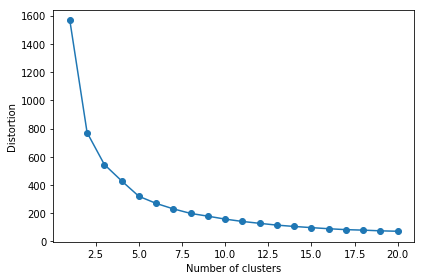

In [116]:
distortions = []
for i in range(1, 21):
    km = KMeans(n_clusters=i, 
                    init='k-means++', # this can be left out, as it is the default
                n_init=10, 
                max_iter=300, 
                random_state=0)
    km.fit(X)
    distortions.append(km.inertia_)
plt.plot(range(1,21), distortions , marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')
plt.tight_layout()
plt.show()

In [112]:
km = KMeans(n_clusters=8, 
            init='random', # leave this out for k-means++ (see below)
            n_init=10, 
            max_iter=300,
            tol=1e-04,
            random_state=0)
kmcls= km.fit(X)
y_km = km.fit_predict(X)
y_km

array([3, 4, 4, 0, 4, 6, 7, 5, 0, 4, 4, 0, 0, 1, 1, 0, 4, 4, 0, 0, 1, 6,
       1, 7, 4, 5, 6, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 4, 2, 6, 0, 1, 4, 2,
       0, 2, 2, 0, 4, 7, 6, 6, 1, 4, 0, 0, 1, 2, 1, 2, 7, 0, 1, 4, 0, 1,
       1, 7, 2, 4, 2, 2, 4, 7, 3, 4, 5, 5, 1, 1, 0, 4, 1, 4, 1, 1, 0, 2,
       0, 6, 0, 1, 2, 7, 1, 5, 1, 1, 7, 7, 3, 0, 1, 7, 1, 3, 1, 5, 0, 2,
       6, 2, 3, 3, 1, 4, 3, 4, 4, 0, 2, 2, 3, 7, 0, 0, 3, 2, 4, 2, 3, 4,
       4, 3, 6, 6, 7, 4, 6, 7, 5, 6, 2, 2, 2, 3, 1, 2, 7, 0, 4, 6, 2, 6,
       2, 5, 5, 1, 4, 5, 5, 7, 7, 2, 4, 4, 1, 4, 5, 2, 6, 6, 1, 6, 7, 1,
       2, 0, 7, 7, 4, 7, 6, 2, 1, 0, 2, 2, 4, 6, 0, 3, 2, 5, 2, 1, 1, 6,
       0, 7, 6, 1, 2, 2, 4, 6, 6, 4, 2, 2, 1, 5, 1, 7, 6, 4, 2, 7, 4, 4,
       4, 6, 2, 2, 6, 4, 7, 5, 7, 4, 1, 6, 7, 4, 6, 4, 4, 3, 3, 2, 2, 4,
       2, 4, 1, 1, 2, 7, 1, 6, 2, 2, 6, 5, 4, 4, 7, 3, 7, 1, 6, 6, 1, 2,
       7, 1, 2, 2, 4, 5, 6, 6, 2, 7, 2, 1, 5, 3, 3, 4, 1, 1, 5, 6, 1, 5,
       2, 4, 1, 5, 3, 7, 3, 3, 6, 1, 7, 6, 5, 6, 3,

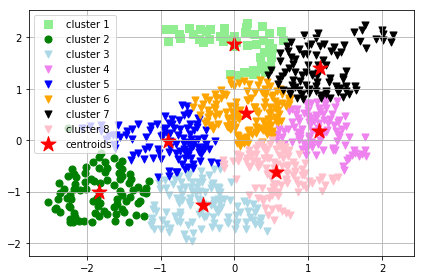

In [115]:
plt.scatter(X[y_km==0,0], 
            X[y_km==0,1], 
            s=50, 
            c='lightgreen', 
            marker='s', 
            label='cluster 1')
plt.scatter(X[y_km==1,0], 
            X[y_km==1,1], 
            s=50, 
            c='green', 
            marker='o', 
            label='cluster 2')
plt.scatter(X[y_km==2,0], 
            X[y_km==2,1], 
            s=50, 
            c='lightblue', 
            marker='v', 
            label='cluster 3')
plt.scatter(X[y_km==3,0], 
            X[y_km==3,1], 
            s=50, 
            c='violet', 
            marker='v', 
            label='cluster 4')
plt.scatter(X[y_km==4,0], 
            X[y_km==4,1], 
            s=50, 
            c='blue', 
            marker='v', 
            label='cluster 5')
plt.scatter(X[y_km==5,0], 
            X[y_km==5,1], 
            s=50, 
            c='orange', 
            marker='v', 
            label='cluster 6')
plt.scatter(X[y_km==6,0], 
            X[y_km==6,1], 
            s=50, 
            c='black', 
            marker='v', 
            label='cluster 7') 
plt.scatter(X[y_km==7,0], 
            X[y_km==7,1], 
            s=50, 
            c='pink', 
            marker='v', 
            label='cluster 8') 
plt.scatter(km.cluster_centers_[:,0], 
            km.cluster_centers_[:,1], 
            s=250, 
            marker='*', 
            c='red', 
            label='centroids') 

plt.legend()
plt.grid()
plt.tight_layout()
#plt.savefig('./figures/centroids.png', dpi=300)
plt.show()

In [101]:
labeled = df.assign(cluster=kmcls.labels_)
labeled.head()

,StartStation latitude,StartStation longitude,StartStation Id Used,cluster
0,51.541596,-0.125441,325.0,1
1,51.466232,-0.113180,2294.0,0
25,51.469217,-0.112687,2323.0,0
50,51.501960,-0.016251,3184.0,3
60,51.469202,-0.119023,3343.0,0


##### USAGE ###

In [81]:
import seaborn as sns
df_startStations.head()

,StartStation Id,Duration,StartStation Id Used,StartStation Address,StartStation latitude,StartStation longitude,StartStation capacity
0,836,3060,325.0,"York Way, Kings Cross",51.541596,-0.125441,24
1,831,1020,2294.0,"St John's Crescent, Brixton",51.466232,-0.113180,25
25,829,1020,2323.0,"Wynne Road, Stockwell",51.469217,-0.112687,25
50,494,1140,3184.0,"South Quay East, Canary Wharf",51.501960,-0.016251,36
60,830,1020,3343.0,"Sidney Road, Stockwell",51.469202,-0.119023,27


In [102]:

variables = [  'StartStation Id Used', 'cluster']
Id = df_startStations['StartStation Id']
df_usage = labeled[variables]
df_usage= pd.concat([Id,df_usage], axis=1)
X_usage = df_usage.values

df_usage.head()

,StartStation Id,StartStation Id Used,cluster
0,836,325.0,1
1,831,2294.0,0
25,829,2323.0,0
50,494,3184.0,3
60,830,3343.0,0


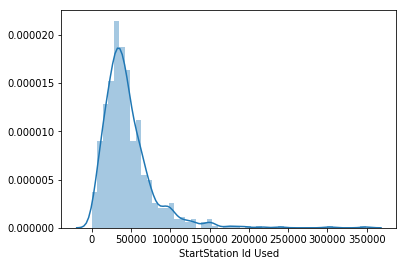

In [103]:
sns.distplot(df_usage['StartStation Id Used'])

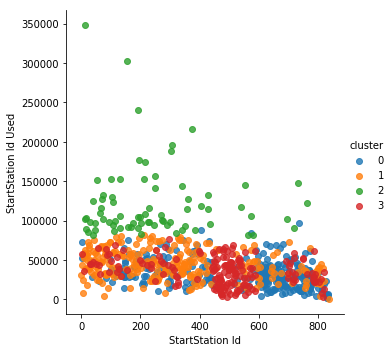

In [104]:
# Plot using Seaborn
sns.lmplot(x='StartStation Id', y='StartStation Id Used', data=df_usage,
           fit_reg=False, 
           hue='cluster')